# Computer Vision 2022 Assignment 2: Image matching and retrieval

In this assignment, you will experiment with image feature detectors, descriptors and matching. There are 3 main parts to the assignment:

- matching an object in a pair of images
- searching for an object in a collection of images
- analysis and discussion of results

This assignment will have a minimum hurdle of 40%. You will fail if you can not reach the minimum hurdle.

## General instructions

As before, you will use this notebook to run your code and display your results and analysis. Again we will mark a PDF conversion of your notebook, referring to your code if necessary, so you should ensure your code output is formatted neatly. 

***When converting to PDF, include the outputs and analysis only, not your code.*** You can do this from the command line using the `nbconvert` command (installed as part of Jupyter) as follows:

    jupyter nbconvert Assignment2.ipynb --to pdf --no-input --TagRemovePreprocessor.remove_cell_tags 'remove-cell'
    # Or
    jupyter nbconvert Assignment2.ipynb --TagRemovePreprocessor.remove_cell_tags='{"remove_cell"}'

**Please do try this ccommond early before the last day! As the commend may be a little bit difference depending on your computer and the environment.**

This will also remove the preamble text from each question. We will use the `OpenCV` library to complete the prac. It has several built in functions that will be useful. You are expected to consult documentation and use them appropriately.

This being the second assignment, we have provided less strict direction this time and you have more flexibility to choose how you answer each question. However you still need to ensure the outputs and report are clear and easy to read. This includes:

- sizing, arranging and captioning image outputs appropriately
- explaining what you have done clearly and concisely
- clearly separating answers to each question

## Data

We have provided some example images for this assignment, available through a link on the MyUni assignment page. The images are organised by subject matter, with one folder containing images of book covers, one of museum exhibits, and another of urban landmarks. Within each category, there is a “Reference” folder containing a clean image of each object and a “Query” folder containing images taken on a mobile device. Within each category, images with the same name contain the same object (so 001.jpg in the Reference folder contains the same book as 001.jpg in the Query folder).
The data is a subset of the Stanford Mobile Visual Search Dataset which is available at 

<http://web.cs.wpi.edu/~claypool/mmsys-dataset/2011/stanford/index.html>. 

The full data set contains more image categories and more query images of the objects we have provided, which may be useful for your testing!

Do not submit your own copy of the data or rename any files or folders! For marking, we will assume the datasets are available in subfolders of the working directory using the same folder names provided.

Here is some general setup code, which you can edit to suit your needs.

In [1]:
# Numpy is the main package for scientific computing with Python. 
import numpy as np
import cv2


import time
# Matplotlib is a useful plotting library for python 
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots, can be changed
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

import os
import glob

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [2]:
def draw_outline(ref, query, model):
    """
        Draw outline of reference image in the query image.
        This is just an example to show the steps involved.
        You can modify to suit your needs.
        Inputs:
            ref: reference image
            query: query image
            model: estimated transformation from query to reference image
    """
    h,w = ref.shape[:2]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,model)
    
    img = query.copy()
    img = cv2.polylines(img, [np.int32(dst)], True, (255, 0, 0), 5, cv2.LINE_AA)
    plt.imshow(img, 'gray')
    plt.show()

def draw_inliers(img1, img2, kp1, kp2, matches, matchesMask):
    """
        Draw inlier between images
        img1 / img2: reference/query  img
        kp1 / kp2: their keypoints
        matches : list of (good) matches after ratio test
        matchesMask: Inlier mask returned in cv2.findHomography() 
    """
    matchesMask = matchesMask.ravel().tolist()
    print("Number of inliers: ", len(matchesMask))
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    plt.imshow(img3, 'gray'),plt.show()


# Question 1: Matching an object in a pair of images (45%)

In this question, the aim is to accurately locate a reference object in a query image, for example:


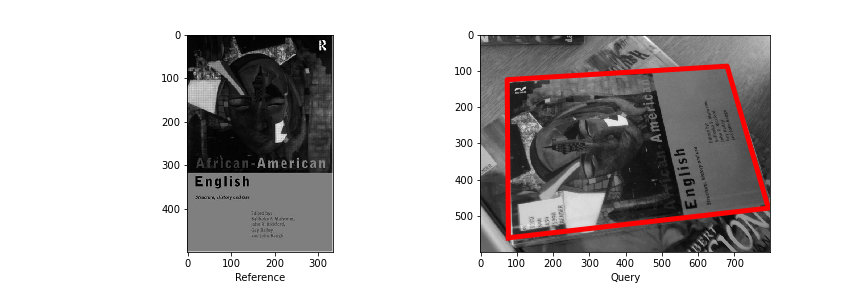

0. Download and read through the paper [ORB: an efficient alternative to SIFT or SURF](https://www.researchgate.net/publication/221111151_ORB_an_efficient_alternative_to_SIFT_or_SURF) by Rublee et al. You don't need to understand all the details, but try to get an idea of how it works. ORB combines the FAST corner detector (covered in week 4) and the BRIEF descriptor. BRIEF is based on similar ideas to the SIFT descriptor we covered week 4, but with some changes for efficiency.

1. [Load images] Load the first (reference, query) image pair from the "book_covers" category using opencv (e.g. `img=cv2.imread()`). Check the parameter option in "
cv2.imread()" to ensure that you read the gray scale image, since it is necessary for computing ORB features.

2. [Detect features] Create opencv ORB feature extractor by `orb=cv2.ORB_create()`. Then you can detect keypoints by `kp = orb.detect(img,None)`, and compute descriptors by `kp, des = orb.compute(img, kp)`. You need to do this for each image, and then you can use `cv2.drawKeypoints()` for visualization.

3. [Match features] As ORB is a binary feature, you need to use HAMMING distance for matching, e.g., `bf = cv2.BFMatcher(cv2.NORM_HAMMING)`. Then you are requried to do KNN matching (k=2) by using `bf.knnMatch()`. After that, you are required to use "ratio_test" to find good matches. By default, you can set `ratio=0.8`.

4. [Plot and analyze] You need to visualize the matches by using the `cv2.drawMatches()` function. Also you can change the ratio values, parameters in `cv2.ORB_create()`, and distance functions in `cv2.BFMatcher()`. Please discuss how these changes influence the match numbers.


In [3]:
# fucntion to get good matches by ratio test

def get_good_matches(matches, ratio):
    good_matches = []
    for i, j in matches:
        if i.distance < ratio*j.distance:
            good_matches.append(i)
    return good_matches

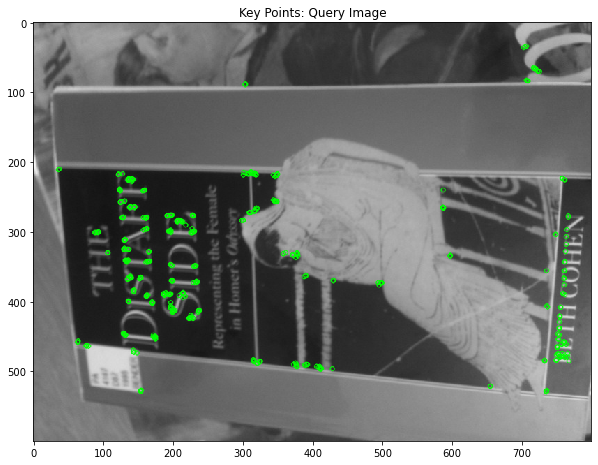

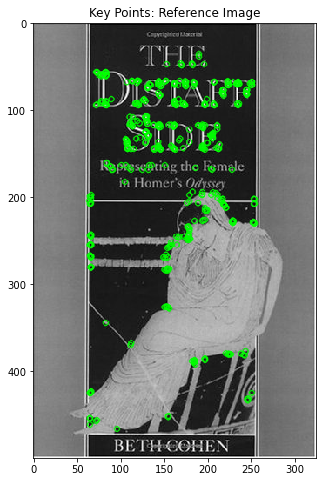

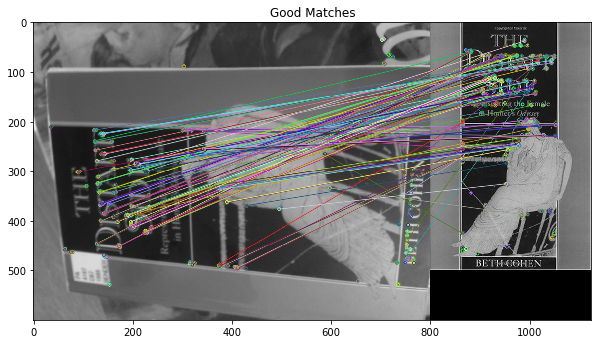

NUMBER OF GOOD MATCHES:  130


In [4]:
# Your code for descriptor matching tests here

# load image at gray scale
query_img = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/book_covers/Query/001.jpg', cv2.IMREAD_GRAYSCALE)
ref_img = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/book_covers/Reference/001.jpg', cv2.IMREAD_GRAYSCALE)

# find the keypoints and descriptors with ORB
orb = cv2.ORB_create()

kpq = orb.detect(query_img,None)
kpq, desq = orb.compute(query_img, kpq)

kpr = orb.detect(ref_img,None)
kpr, desr = orb.compute(ref_img, kpr)

# draw keypoints
img_q = cv2.drawKeypoints(query_img, kpq, None, color=(0,255,0), flags=0)
plt.title('Key Points: Query Image'), plt.imshow(img_q, 'gray')
plt.show()
img_r = cv2.drawKeypoints(ref_img, kpr, None, color=(0,255,0), flags=0)
plt.title('Key Points: Reference Image'), plt.imshow(img_r, 'gray')
plt.show()

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq,desr,k=2)

# Apply ratio test
good_matches = get_good_matches(matches, 0.8)

# draw matches
img = cv2.drawMatches(img_q, kpq, img_r, kpr, good_matches, None)
plt.title("Good Matches"), plt.imshow(img), plt.show()

print("NUMBER OF GOOD MATCHES: ", len(good_matches))

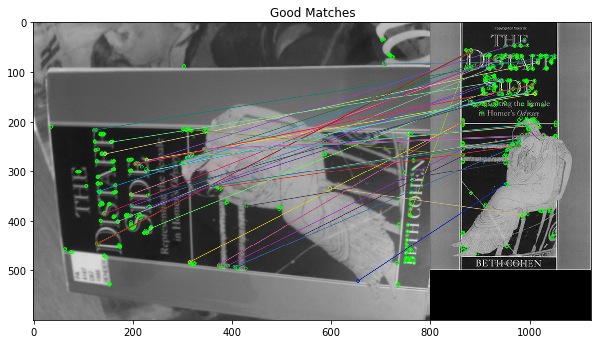

NUMBER OF GOOD MATCHES:  46


In [5]:
# using norm as NORM_L2 with the BFMatcher object

bf_ = cv2.BFMatcher(cv2.NORM_L2)

# Match descriptors.
matches_ = bf_.knnMatch(desq,desr,k=2)

# Apply ratio test
good_matches_ = get_good_matches(matches_, 0.8)

# draw matches
img_ = cv2.drawMatches(img_q, kpq, img_r, kpr, good_matches_, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches"), plt.imshow(img_), plt.show()

print("NUMBER OF GOOD MATCHES: ", len(good_matches_))

***Your explanation of what you have done, and your results, here***

***Change in the parameters:***

1: When we change the ratio value in the ratio test, the numbers of matches change. If we change the ratio value to 0.4, the number of matches is less than half of the original number, which is understandable as with 0.4 (strong filtering)less matches are being considered as good matches.

2: When we change the number of features in the ORB detector keeping the ratio in the ratio test constant, there is a change observed in the number of good matches. If we change the number of features to 100, the number of matches is less than half of the original number. And if we change the number of features to 1000, the number of matches is greater than the orginal number.

3: In the cv2.BFMatcher(), if we change the distance function from cv2.NORM_HAMMING to cv2.NORM_L2, the number of matches is less than half of the original number. With NORM_HAMMING, the ratio test is working well and giving us 130 matches. 
However, when the norm is set to NORM_L2, the ratio test is not working well and giving us only 46 matches, this is because the NORM_L2 is a good option for the SHIFT and SURF methods but not for binary string based methods like ORB.

Also, if we put cross check in the cv2.BFMatcher(), the code gives an error message: "OpenCV(4.5.4) ../modules/core/src/batch_distance.cpp:303: error: (-215:Assertion failed) K == 1 && update == 0 && mask.empty() in function 'batchDistance'".

ref: https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html

3. Estimate a homography transformation based on the matches, using `cv2.findHomography()`. Display the transformed outline of the first reference book cover image on the query image, to see how well they match.

    - We provide a function `draw_outline()` to help with the display, but you may need to edit it for your needs.
    - Try the 'least squre method' option to compute homography, and visualize the inliers by using `cv2.drawMatches()`. Explain your results.
    - Again, you don't need to compare results numerically at this stage. Comment on what you observe visually.

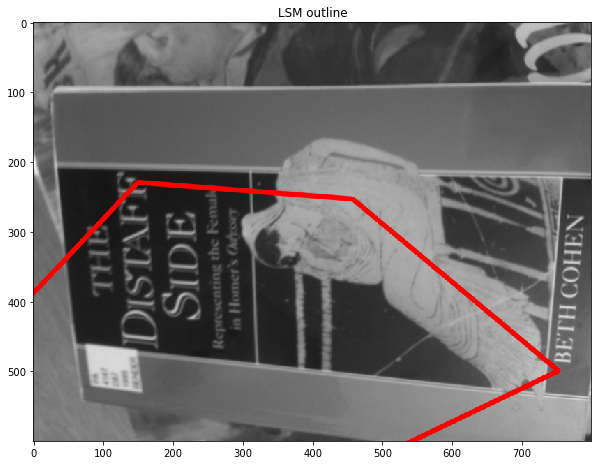

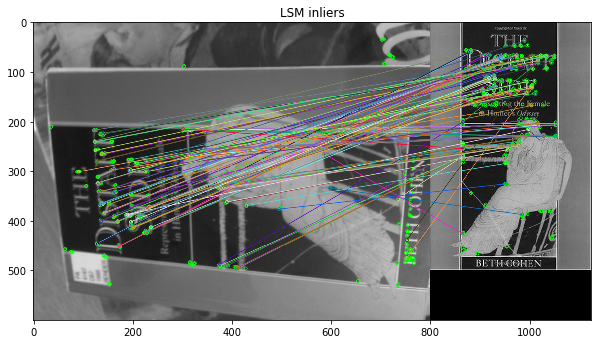

LSM inliers:  130


In [6]:
# Your code to display book location here

q_pts = np.float32([kpq[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
r_pts = np.float32([kpr[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)

# getting a color image for visual aid
query_color = cv2.cvtColor(query_img, cv2.COLOR_GRAY2BGR)

# using regular method (cv2.findHomography)
matrix_lsm, mask_lsm = cv2.findHomography(r_pts, q_pts, 0) #0 = lease square method

# draw outline
plt.title('LSM outline')
im_lse = draw_outline(ref_img, query_color, matrix_lsm)

# draw inliers
plt.title('LSM inliers')
img1 = cv2.drawMatches(img_q, kpq, img_r, kpr, good_matches, mask_lsm, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img1), plt.show()

print("LSM inliers: ", len(mask_lsm))

***Your explanation of results here***

We see that with the give paramenters/good matches, the Least Squared Method is not very good at giving out an accurate outline of the reference image on the query image. This may be because this method uses all the points availabe and hence be affected by the outliers.

The RANSAC and the RHO methods are good at giving an accurate outline of the reference image on the query image, as they are good at handling outliers.

Try the RANSAC option to compute homography. Change the RANSAC parameters, and explain your results. Print and analyze the inlier numbers. Hint: use cv2.RANSCA with cv2.findHomography.


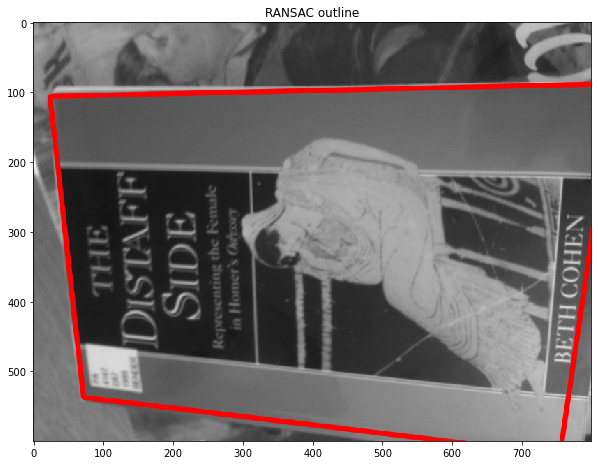

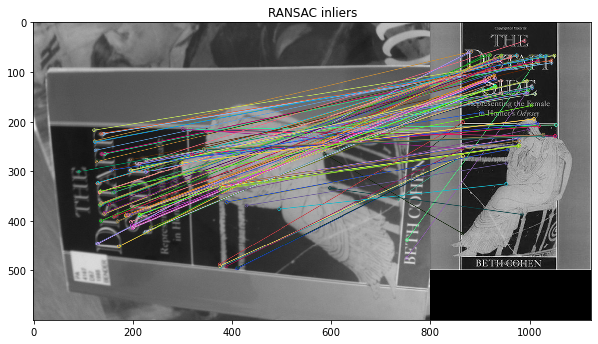

RANSAC inliners:  130


In [7]:
# Your code to display book location after RANSAC here
matrix_ransac, mask_ransac = cv2.findHomography(r_pts, q_pts, cv2.RANSAC)

plt.title('RANSAC outline')
im_rancas = draw_outline(ref_img, query_color, matrix_ransac)

plt.title('RANSAC inliers')
im = cv2.drawMatches(query_img, kpq, ref_img, kpr, good_matches, mask_ransac , None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(im), plt.show()


print("RANSAC inliners: ", len(mask_ransac))

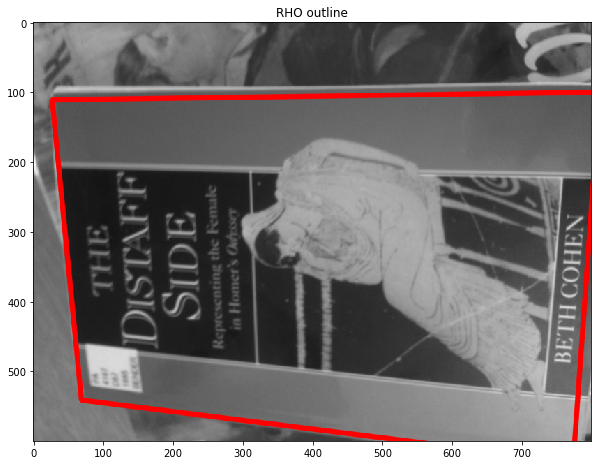

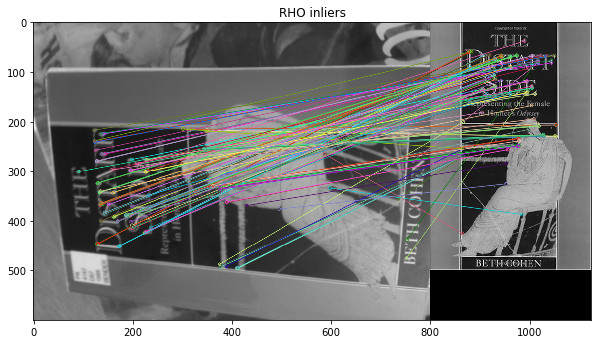

RHO inliers:  130


In [8]:
# Using cv2.Rho which is a weighted RANSAC modification.
matrix_rho, mask_rho = cv2.findHomography(r_pts, q_pts, cv2.RHO)

plt.title('RHO outline')
im_rho = draw_outline(ref_img, query_color, matrix_rho)

plt.title('RHO inliers')
im = cv2.drawMatches(query_img, kpq, ref_img, kpr, good_matches, mask_rho , None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(im), plt.show()

print("RHO inliers: ", len(mask_rho))

***Your explanation of what you have tried, and results here***

The RANSAC method gave a good result with the same parameters. The outline of the reference image on the query image is very good. The RANSAC is good at handling outliers therefore it gave us a good result.
The same can be said for the RHO method.


6. Finally, try matching several different image pairs from the data provided, including at least one success and one failure case. For the failure case, test and explain what step in the feature matching has failed, and try to improve it. Display and discuss your findings.
    1. Hint 1: In general, the book covers should be the easiest to match, while the landmarks are the hardest.
    2. Hint 2: Explain why you chose each example shown, and what parameter settings were used.
    3. Hint 3: Possible failure points include the feature detector, the feature descriptor, the matching strategy, or a combination of these.

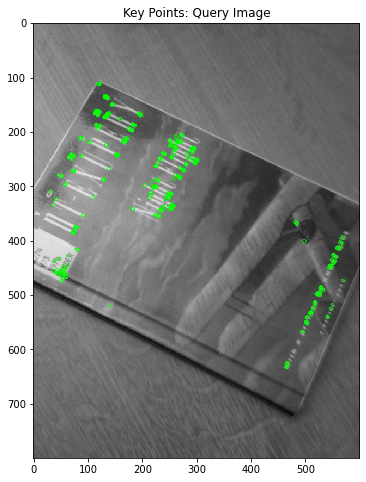

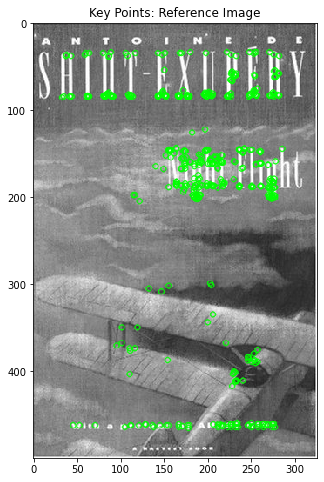

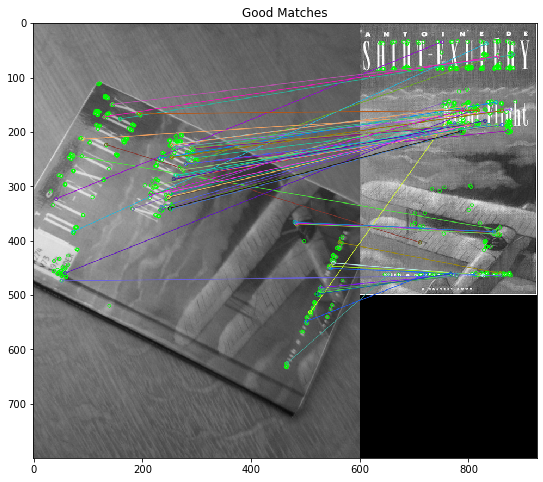

NUMBER OF GOOD MATCHES:  69


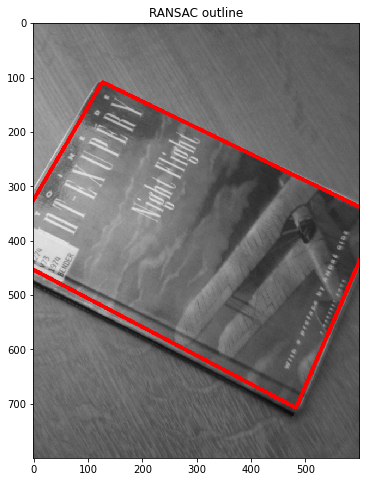

In [12]:
# Your results for other image pairs here
q_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/book_covers/Query/007.jpg', cv2.IMREAD_GRAYSCALE)
r_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/book_covers/Reference/007.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(q_im2, cv2.COLOR_GRAY2BGR)
orb = cv2.ORB_create()

kpq2 = orb.detect(q_im2,None)
kpq2, desq2 = orb.compute(q_im2, kpq2)

kpr2 = orb.detect(r_im2,None)
kpr2, desr2 = orb.compute(r_im2, kpr2)

# draw keypoints
img_q2 = cv2.drawKeypoints(q_im2, kpq2, q_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Query Image'), plt.imshow(img_q2, 'gray')
plt.show()
img_r2 = cv2.drawKeypoints(r_im2, kpr2, r_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Reference Image'), plt.imshow(img_r2, 'gray')
plt.show()


# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
new_good_matches = get_good_matches(matches, 0.8)

# Draw matches
img = cv2.drawMatches(img_q2, kpq2, img_r2, kpr2, new_good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches"), plt.imshow(img), plt.show()

print("NUMBER OF GOOD MATCHES: ", len(new_good_matches))


# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in new_good_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in new_good_matches]).reshape(-1,1,2)

if len(q_pts2) >= 4 and len(r_pts2) >= 4:
    matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC, 5.0)
    plt.title('RANSAC outline')
    im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)
else:
    print("THE IMAGE DOESNOT EXIST")



The above example is a great test beacsue the iamges is tilted and a little distorted, however it still gives a good outline. 

This shows that RANSAC is a better option that LEASE SQUARE METHOD.

Most of the parameters are set to their default values, with the ratio test at 0.8

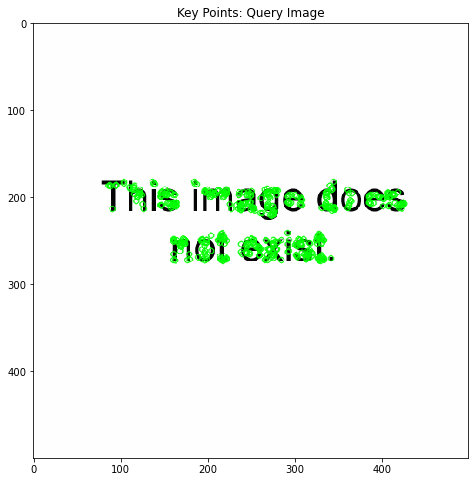

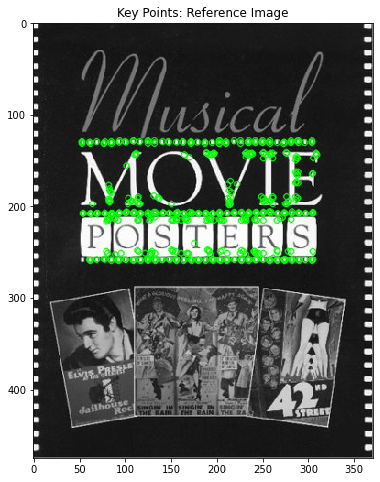

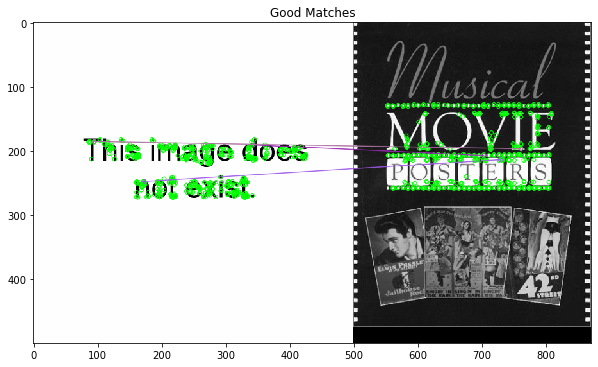

NUMBER OF GOOD MATCHES:  3
THE IMAGE DOESNOT EXIST


In [9]:
# Your results for other image pairs here
q_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/book_covers/Query/055.jpg', cv2.IMREAD_GRAYSCALE)
r_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/book_covers/Reference/055.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(q_im2, cv2.COLOR_GRAY2BGR)
orb = cv2.ORB_create()

kpq2 = orb.detect(q_im2,None)
kpq2, desq2 = orb.compute(q_im2, kpq2)

kpr2 = orb.detect(r_im2,None)
kpr2, desr2 = orb.compute(r_im2, kpr2)

# draw keypoints
img_q2 = cv2.drawKeypoints(q_im2, kpq2, q_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Query Image'), plt.imshow(img_q2, 'gray')
plt.show()
img_r2 = cv2.drawKeypoints(r_im2, kpr2, r_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Reference Image'), plt.imshow(img_r2, 'gray')
plt.show()


# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
new_good_matches = get_good_matches(matches, 0.8)

# Draw matches
img = cv2.drawMatches(img_q2, kpq2, img_r2, kpr2, new_good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches"), plt.imshow(img), plt.show()

print("NUMBER OF GOOD MATCHES: ", len(new_good_matches))


# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in new_good_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in new_good_matches]).reshape(-1,1,2)

if len(q_pts2) >= 4 and len(r_pts2) >= 4:
    matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC, 5.0)
    plt.title('RANSAC outline')
    im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)
else:
    print("THE IMAGE DOESNOT EXIST")



The above image is used bacsuse the query image for this is does not exist and this is a 100% incorrect case.

So the prediction of "not in the dataset" is a correct prediction.

The parameters are still at their default settings.

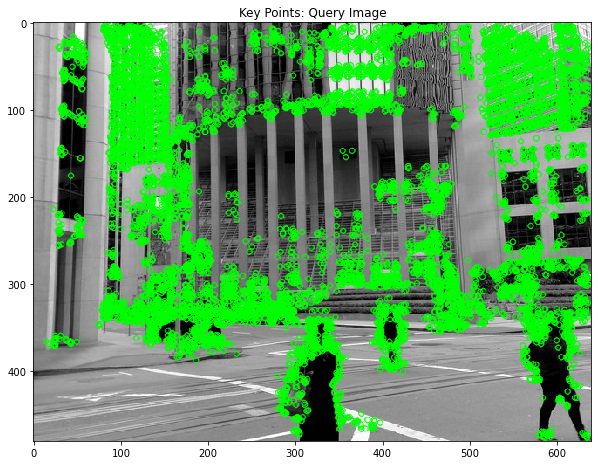

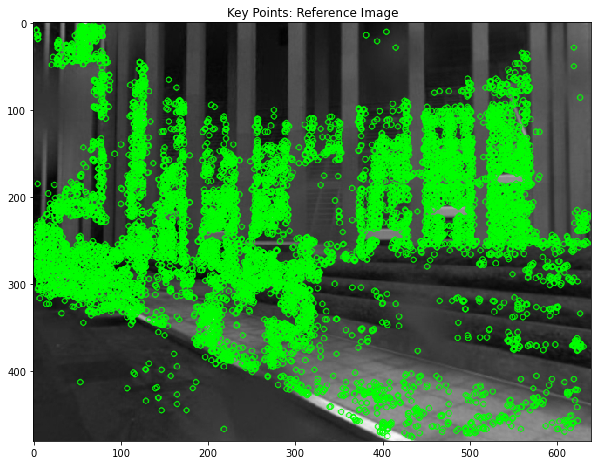

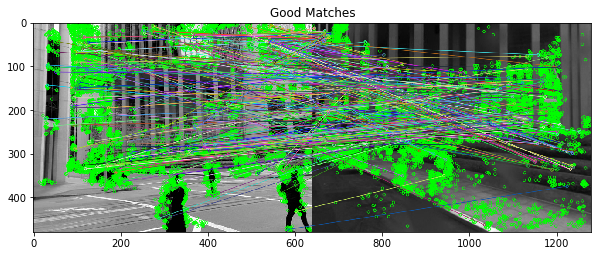

NUMBER OF GOOD MATCHES:  242


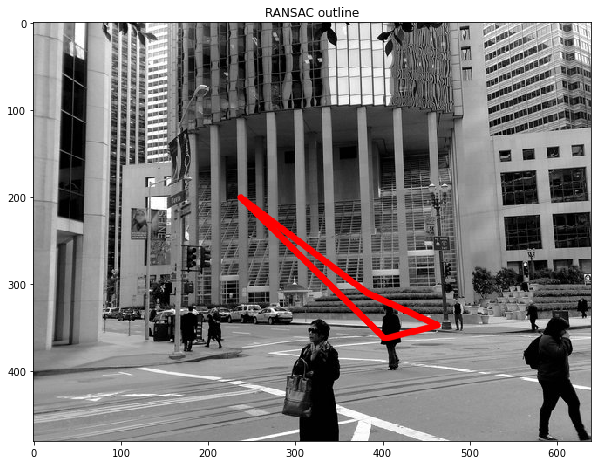

In [13]:
# the following image is used bacsuse the query image for this is inverted and the reference image is not inverted,
# so this would be a good test for the RANSAC method

q_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/landmarks/Query/001.jpg', cv2.IMREAD_GRAYSCALE)
r_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/landmarks/Reference/001.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(q_im2, cv2.COLOR_GRAY2BGR)
orb = cv2.ORB_create(10000)
orb.setFastThreshold(0)
orb.setEdgeThreshold(0)

kpq2 = orb.detect(q_im2,None)
kpq2, desq2 = orb.compute(q_im2, kpq2)

kpr2 = orb.detect(r_im2,None)
kpr2, desr2 = orb.compute(r_im2, kpr2)

# draw keypoints
img_q2 = cv2.drawKeypoints(q_im2, kpq2, q_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Query Image'), plt.imshow(img_q2, 'gray')
plt.show()
img_r2 = cv2.drawKeypoints(r_im2, kpr2, r_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Reference Image'), plt.imshow(img_r2, 'gray')
plt.show()


# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
new_good_matches = get_good_matches(matches, 0.8)

# Draw matches
img = cv2.drawMatches(img_q2, kpq2, img_r2, kpr2, new_good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches"), plt.imshow(img), plt.show()

print("NUMBER OF GOOD MATCHES: ", len(new_good_matches))


# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in new_good_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in new_good_matches]).reshape(-1,1,2)

matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC)

# mask_list = mask_ransac2.ravel().tolist()

# 
plt.title('RANSAC outline')
im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)

The above test is taken from the landmarks dataset. The specific query was selected because it had a lot of noise and there was a considerable difference of the angle at which the image was taken.



The RANSAC method is very good at handling outliers. However, in this case, the RANSAC method is not able to find a good match with the same parameters as the previous test. (k=2, ratio=0.8, norm=NORM_HAMMING) the total number of good matches is 16, at 0.8 ratio

however, it gets to 453 with no ratio test, this shows the key points are not being detected properly or a lot of key points that are being detetcted are outliers. 


#####

I also changed the ORB parameters to try and get a better result. 
I set the nParameter to 10000 - to get more key points that would help the match
I set the fasthreshold to True, 
but the results are still not very accurate

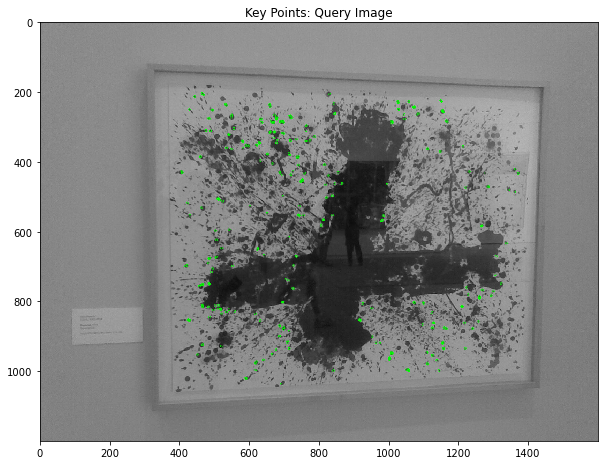

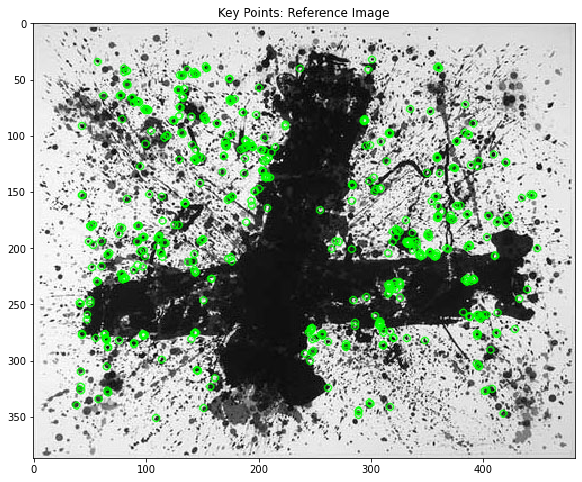

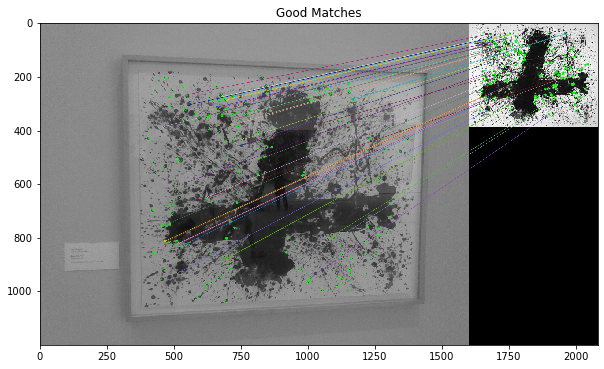

NUMBER OF GOOD MATCHES:  44


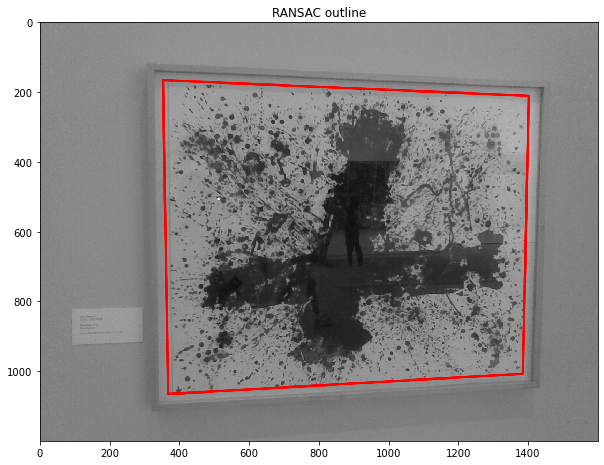

In [14]:
# the following image is used bacsuse the query image for this is inverted and the reference image is not inverted,
# so this would be a good test for the RANSAC method

q_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Query/014.jpg', cv2.IMREAD_GRAYSCALE)
r_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Reference/014.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(q_im2, cv2.COLOR_GRAY2BGR)
orb = cv2.ORB_create()

kpq2 = orb.detect(q_im2,None)
kpq2, desq2 = orb.compute(q_im2, kpq2)

kpr2 = orb.detect(r_im2,None)
kpr2, desr2 = orb.compute(r_im2, kpr2)

# draw keypoints
img_q2 = cv2.drawKeypoints(q_im2, kpq2, q_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Query Image'), plt.imshow(img_q2, 'gray')
plt.show()
img_r2 = cv2.drawKeypoints(r_im2, kpr2, r_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Reference Image'), plt.imshow(img_r2, 'gray')
plt.show()


# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
new_good_matches = get_good_matches(matches, 0.8)

# Draw matches
img = cv2.drawMatches(img_q2, kpq2, img_r2, kpr2, new_good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches"), plt.imshow(img), plt.show()

print("NUMBER OF GOOD MATCHES: ", len(new_good_matches))


# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in new_good_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in new_good_matches]).reshape(-1,1,2)

matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC, 5.0)
 
plt.title('RANSAC outline')
im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)



The above test produces good results as we get some good matches that are not outliers.
The query image is also very clear with not much of a distortion.


Here , the parameters are again set to default with the ORB to 200 samples and the ratio test at 0.8

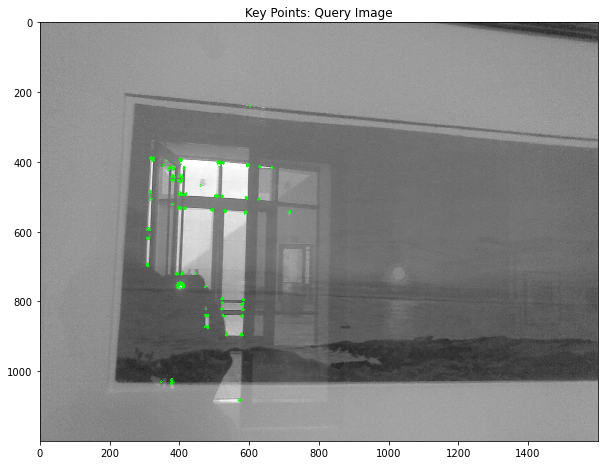

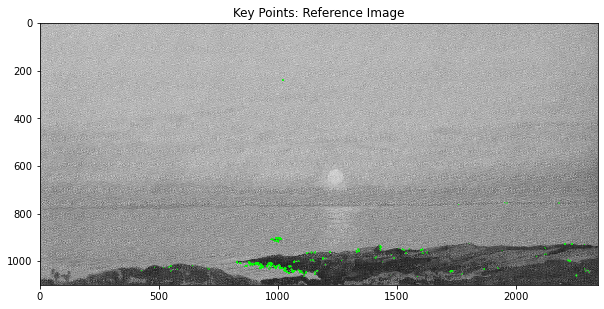

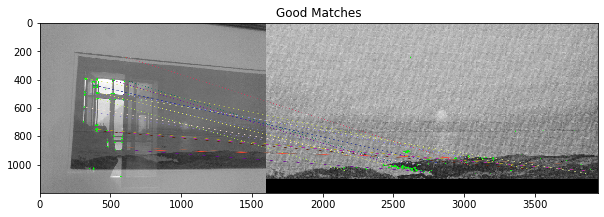

NUMBER OF GOOD MATCHES:  25


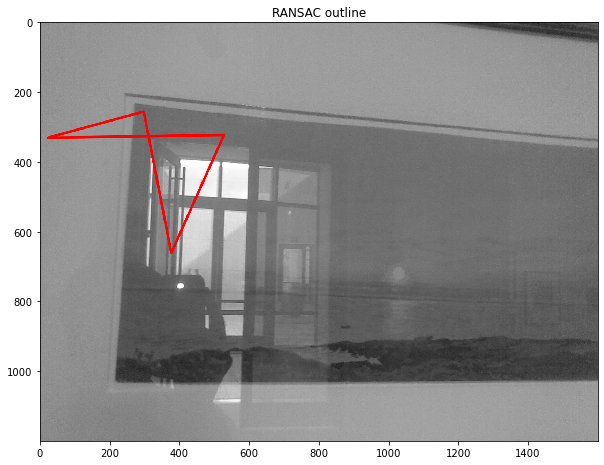

In [17]:
# the following image is used bacsuse the query image for this is inverted and the reference image is not inverted,
# so this would be a good test for the RANSAC method

q_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Query/048.jpg', cv2.IMREAD_GRAYSCALE)
r_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Reference/048.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(q_im2, cv2.COLOR_GRAY2BGR)
orb = cv2.ORB_create()

# getting key points
kpq2 = orb.detect(q_im2,None)
kpq2, desq2 = orb.compute(q_im2, kpq2)

kpr2 = orb.detect(r_im2,None)
kpr2, desr2 = orb.compute(r_im2, kpr2)

# draw keypoints
img_q2 = cv2.drawKeypoints(q_im2, kpq2, q_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Query Image'), plt.imshow(img_q2, 'gray')
plt.show()
img_r2 = cv2.drawKeypoints(r_im2, kpr2, r_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Reference Image'), plt.imshow(img_r2, 'gray')
plt.show()


# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
new_good_matches = get_good_matches(matches, 0.8)

# Draw matches
img = cv2.drawMatches(img_q2, kpq2, img_r2, kpr2, new_good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches"), plt.imshow(img), plt.show()

print("NUMBER OF GOOD MATCHES: ", len(new_good_matches))


# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in new_good_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in new_good_matches]).reshape(-1,1,2)

matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC)
 
plt.title('RANSAC outline')
im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)

The above image is selected as it is a good test because of the major reflection that it has, it also has a little distortion. 

Because of all that, the results with the default setting is not correct at all.
The ORB is at 200 samples and the ratio test is at 0.8


I am plannig to change those parametes for the next run!

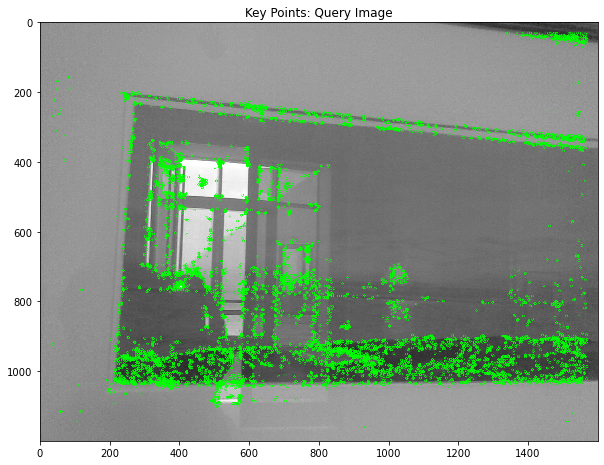

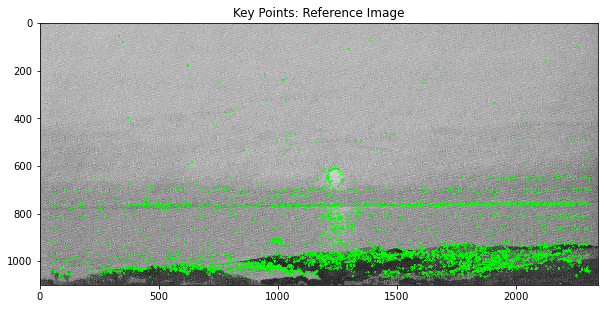

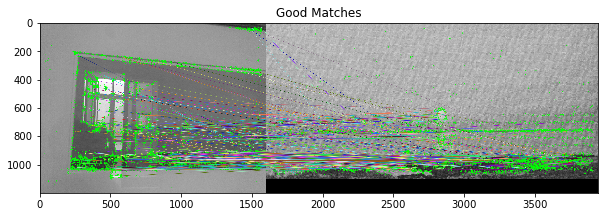

NUMBER OF GOOD MATCHES:  289


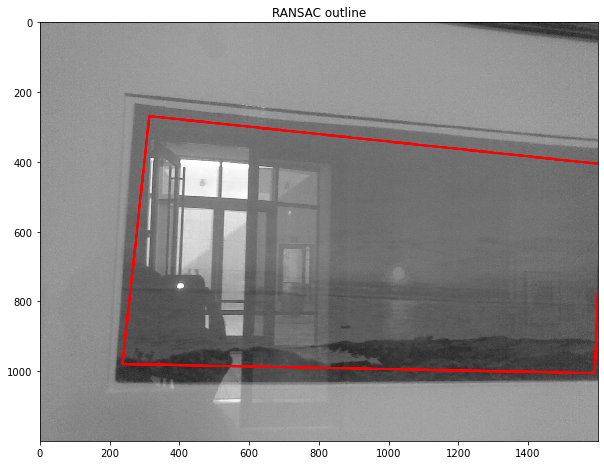

In [14]:
# the following image is used bacsuse the query image for this is inverted and the reference image is not inverted,
# so this would be a good test for the RANSAC method

q_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Query/048.jpg', cv2.IMREAD_GRAYSCALE)
r_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Reference/048.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(q_im2, cv2.COLOR_GRAY2BGR)
orb = cv2.ORB_create(10000)
orb.setFastThreshold(0)
kpq2 = orb.detect(q_im2,None)
kpq2, desq2 = orb.compute(q_im2, kpq2)

kpr2 = orb.detect(r_im2,None)
kpr2, desr2 = orb.compute(r_im2, kpr2)

# draw keypoints
img_q2 = cv2.drawKeypoints(q_im2, kpq2, q_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Query Image'), plt.imshow(img_q2, 'gray')
plt.show()
img_r2 = cv2.drawKeypoints(r_im2, kpr2, r_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Reference Image'), plt.imshow(img_r2, 'gray')
plt.show()


# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
new_good_matches = get_good_matches(matches, 0.8)

# Draw matches
img = cv2.drawMatches(img_q2, kpq2, img_r2, kpr2, new_good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches"), plt.imshow(img), plt.show()

print("NUMBER OF GOOD MATCHES: ", len(new_good_matches))


# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in new_good_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in new_good_matches]).reshape(-1,1,2)

matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC)
 
plt.title('RANSAC outline')
im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)

Initial:

The above test gave a poor result and we only get a few good matches, which are outliers as the drawmatches() function shows that the matches are with a background reflection on the query image.

We could say that most/almost all of the matches are outliers, as with 0.8 the ratio test gives 25 matches, but with ratio = 1 (no penalty) the ratio test gives 447 matches, and ORB is at 200 samples


##########

After:

But after changing the ORB parameter to 10000 samples and setting fast threshold to True, it gave a really good outline.

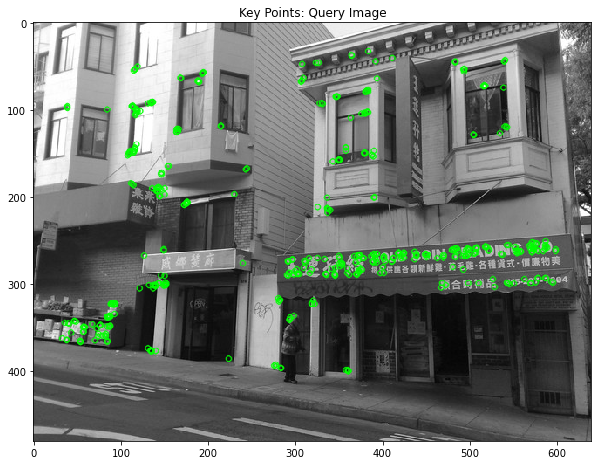

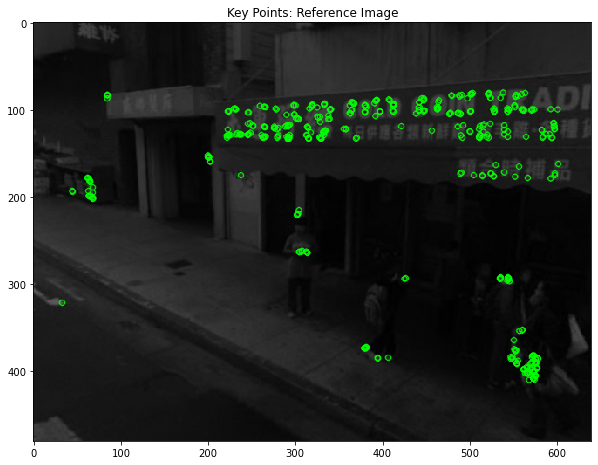

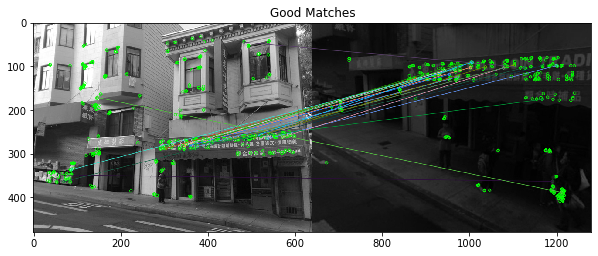

NUMBER OF GOOD MATCHES:  24


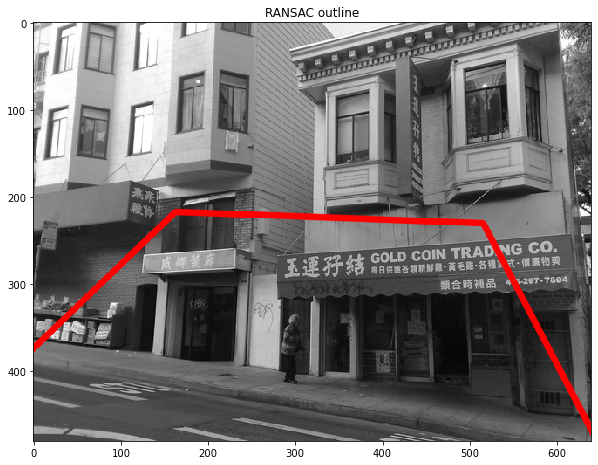

In [17]:
# the following image is used bacsuse the query image for this is inverted and the reference image is not inverted,
# so this would be a good test for the RANSAC method

q_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/landmarks/Query/070.jpg', cv2.IMREAD_GRAYSCALE)
r_im2 = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/landmarks/Reference/070.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(q_im2, cv2.COLOR_GRAY2BGR)
orb = cv2.ORB_create()

kpq2 = orb.detect(q_im2,None)
kpq2, desq2 = orb.compute(q_im2, kpq2)

kpr2 = orb.detect(r_im2,None)
kpr2, desr2 = orb.compute(r_im2, kpr2)

# draw keypoints
img_q2 = cv2.drawKeypoints(q_im2, kpq2, q_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Query Image'), plt.imshow(img_q2, 'gray')
plt.show()
img_r2 = cv2.drawKeypoints(r_im2, kpr2, r_im2, color=(0,255,0), flags=0)
plt.title('Key Points: Reference Image'), plt.imshow(img_r2, 'gray')
plt.show()


# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
new_good_matches = get_good_matches(matches, 0.8)

# Draw matches
img = cv2.drawMatches(img_q2, kpq2, img_r2, kpr2, new_good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches"), plt.imshow(img), plt.show()

print("NUMBER OF GOOD MATCHES: ", len(new_good_matches))


# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in new_good_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in new_good_matches]).reshape(-1,1,2)

matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC, 5.0)
 
plt.title('RANSAC outline')
im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)

The above test from the 'landmarks' dataset is also very good. The query image is very clear and the reference image is not distorted.
hence, the result is accurate.

***Your explanation of results here***

The above tests clearly indicate that the test workes very well on all the examples where the query image is not distorted. The RANSAC method is very good at handling outliers, but not when all the key points give incorrect matches. 
This mostly happens with the images from the 'landmarks' dataset and the 'museum_paintings' dataset.


Changing the ORB parameter 'nsamples' gave the best results when we changes it from 200 samples to 10000 samples. 
However, it takes more time than the previous methods.

# Question 2: What am I looking at? (40%)


<!--One application of feature matching is image retrieval. The goal of image retrieval is, given a query image of an object, to find all images in a database containing the same object, and return the results in ranked order (like a Google search). This is a huge research area but we will implement a very basic version of the problem based on the small dataset provided.-->

In this question, the aim is to identify an "unknown" object depicted in a query image, by matching it to multiple reference images, and selecting the highest scoring match. Since we only have one reference image per object, there is at most one correct answer. This is useful for example if you want to automatically identify a book from a picture of its cover, or a painting or a geographic location from an unlabelled photograph of it.

The steps are as follows:

1. Select a set of reference images and their corresponding query images. 

    1. Hint 1: Start with the book covers, or just a subset of them.
    3. Hing 2: This question can require a lot of computation to run from start to finish, so cache intermediate results (e.g. feature descriptors) where you can.
    
2. Choose one query image corresponding to one of your reference images. Use RANSAC to match your query image to each reference image, and count the number of inlier matches found in each case. This will be the matching score for that image.

3. Identify the query object. This is the identity of the reference image with the highest match score, or "not in dataset" if the maximum score is below a threshold.

4. Repeat steps 2-3 for every query image and report the overall accuracy of your method (that is, the percentage of query images that were correctly matched in the dataset). Discussion of results should include both overall accuracy and individual failure cases.

    1. Hint 1: In case of failure, what ranking did the actual match receive? If we used a "top-k" accuracy measure, where a match is considered correct if it appears in the top k match scores, would that change the result?

<!--Code to implement this algorithm should mostly be written in a supporting file such as a2code.py. Call your code and display outputs in the notebook below.--> 


In [18]:
# Function to get inline matches as score
def get_inline_scores(reference_images, desq, kpq, orb):
    # returns an array of the sum of the inline matches for each refrence image 

    score = []
    for r_image in reference_images:
        
        # get the key points and descriptors for the reference image
        kpr = orb.detect(r_image, None)
        kpr, desr = orb.compute(r_image, kpr)

        # get the matches between the query image and the reference image
        bf = cv2.BFMatcher(cv2.NORM_HAMMING)

        matches = bf.knnMatch(desq, desr, k=2)

        good_matches = get_good_matches(matches, 0.8)

        # get the inline matches using RANSAC and homography
        q_pts = np.float32([kpq[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
        r_pts = np.float32([kpr[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)
        
        if len(q_pts) > 3 and len(r_pts) > 3:
            matrix, matchesMask = cv2.findHomography(r_pts, q_pts, cv2.RANSAC, 5.0)
            matchesMask = matchesMask.ravel().tolist()
            inline_matches = np.sum(matchesMask)
            score.append(inline_matches)
        else:
            score.append(-1)
            
    return score

In [19]:
def get_query_from_score(score, threshold):
    # returns the index of the query image with the highest inline score
    max_score = max(score)
    if max_score > threshold:
        return score.index(max_score)
    else:
        return -1

In [297]:
# Reading the query and reference images in order

query_books = sorted(glob.glob(os.path.join( '/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/book_covers/Query/*.jpg')))
reference_books = sorted(glob.glob(os.path.join( '/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/book_covers/Reference/*.jpg')))

query_images = []
reference_images = []

for image in query_books:
    i = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    query_images.append(i)

for image in reference_books:
    i = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    reference_images.append(i)

The book is in the reference library at the position: 40


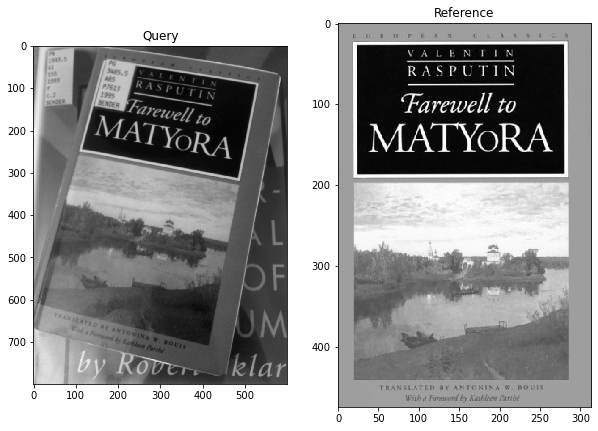

In [312]:
score = []
key = 40

q_image = query_images[key]

fig = plt.figure()

ax = fig.add_subplot(1, 2, 1)
imgplot = plt.imshow(q_image)
ax.set_title('Query')

ax = fig.add_subplot(1, 2, 2)
imgplot = plt.imshow(reference_images[key])
ax.set_title('Reference')

orb = cv2.ORB_create(10000)
# orb.setFastThreshold(0)

kpq = orb.detect(q_image, None)
kpq, desq = orb.compute(q_image, kpq)

score = get_inline_scores(reference_images, desq, kpq, orb)

thershold = 6 # the number of inline matches required to be considered a match
# print("Score for all the images:")
pred = get_query_from_score(score, thershold)
if pred == key:
    print("The book is in the reference library at the position: " + str(pred))
else:
    print("The book is not correctly matched in the reference library")

The above test gives a correct output for the image number 55 ("This image does not exist")

The above test gives an incorrect prediction for image 67 (matching it to ref no.39)

The above test gives an incorrect prediction for image 70 (matching it to ref no.97)

The above test gives an incorrect prediction for image 76 (matching it to ref no.11)

In [300]:
# Doing step 2 and 3 for first 50 the query images and reporting the accuracy i.e.
# the number of correct matches in the dataset

thershold = 6 # the number of inline matches required to be considered a match
correct_predictions = 0 # counting the correct predictions
preds = [] # a list of predictions ; cache

for i in range(len(query_images[:50])):
    
    key = i 
    q_image = query_images[i]
    
    # creating ORB detetctor with nfeatures = 10000
    orb = cv2.ORB_create(10000)
    kpq = orb.detect(q_image, None)
    kpq, desq = orb.compute(q_image, kpq)
    
    # Calling the get_inline_score function to obtain
    # the number of inliers i.e. matching score
    score = get_inline_scores(reference_images[:50], desq, kpq, orb)
    
    # Calling the get_query_from_score function to get check the threshold value
    # and get the index of the predicted image
    pred = get_query_from_score(score, thershold)
    preds.append(pred) # chching the predictins for corrections
    
    # Checking if correct then incrementing the correct_predictions variable
    if pred == key:
        correct_predictions += 1
        
        
# Calculating the percentage of the correct predictions i.e. accuracy
percentage_win = (correct_predictions/len(query_images[:50]))*100

# Printing the accuracy and correct_predictions
print(str(correct_predictions) + " correct predictions from " + str(len(query_images[:50])) + " images")

print("The accuracy of the prediction is : " + str(percentage_win))

50 correct predictions from 50 images
The accuracy of the prediction is : 100.0


The first 50 images gives a 100% result 

using the current parameters of nsamples of 10000 and threshold of 15

In [42]:
# Doing step 2 and 3 for all the query images and reporting the accuracy i.e.
# the number of correct matches in the dataset

thershold = 6 # the number of inline matches required to be considered a match
correct_predictions = 0 # counting the correct predictions
preds = [] # a list of predictions ; cache

for i in range(len(query_images)):
    
    key = i 
    q_image = query_images[i]
    
    # creating ORB detetctor with nfeatures = 10000
    orb = cv2.ORB_create(10000)
    kpq = orb.detect(q_image, None)
    kpq, desq = orb.compute(q_image, kpq)
    
    # Calling the get_inline_score function to obtain
    # the number of inliers i.e. matching score
    score = get_inline_scores(reference_images, desq, kpq, orb)
    
    # Calling the get_query_from_score function to get check the threshold value
    # and get the index of the predicted image
    pred = get_query_from_score(score, thershold)
    preds.append(pred) # chching the predictins for corrections
    
    # Checking if correct then incrementing the correct_predictions variable
    if pred == key:
        correct_predictions += 1

In [43]:
# Calculating the percentage of the correct predictions i.e. accuracy
percentage_win = (correct_predictions/len(query_images))*100

# Printing the accuracy and correct_predictions
print(str(correct_predictions) + " correct predictions from " + str(len(query_images)) + " images")

print("The accuracy of the prediction is : " + str(percentage_win))

97 correct predictions from 101 images
The accuracy of the prediction is : 96.03960396039604


In [50]:
# The incorrect cases
print("Query : Predictions")
for i in range(len(query_images)):
    if preds[i] != i:
        print(str(i) + "  \t" + str(preds[i]))

Query : Predictions
54  	96
67  	39
70  	97
76  	11


The above test gives a correct output for the image number 55 ("This image does not exist")

The above test gives an incorrect prediction for image 67 (matching it to ref no.39)

The above test gives an incorrect prediction for image 70 (matching it to ref no.97)

The above test gives an incorrect prediction for image 76 (matching it to ref no.11)

In [51]:
correct_predictions+=1

# Calculating the percentage of the correct predictions i.e. accuracy
percentage_win = (correct_predictions/len(query_images))*100

# Printing the accuracy and correct_predictions
print(str(correct_predictions) + " correct predictions from " + str(len(query_images)) + " images")

print("The accuracy of the prediction is : " + str(percentage_win))

98 correct predictions from 101 images
The accuracy of the prediction is : 97.02970297029702


In [52]:
# using the top-k accuracy measure
# using k = 3

def topK(score, k):
    out = sorted(score, reverse=True)
    return out[:k]

In [54]:
# checking the individual images with the top k values

score = []
check_score = []
keys = [67, 70, 76]

for key in keys:
    
    q_image = query_images[key]

    orb = cv2.ORB_create(10000)

    kpq = orb.detect(q_image, None)
    kpq, desq = orb.compute(q_image, kpq)

    score = get_inline_scores(reference_images, desq, kpq, orb)

    check_score = score

    thershold = 6 # the number of inline matches required to be considered a match

    pred = topK(check_score, 5)
    print("\n###############################")
    print("Predicted      Actual")
    for i in pred:
        print(str(check_score.index(i)) + "\t\t" + str(key))
        check_score.remove(i)


###############################
Predicted      Actual
39		67
99		67
11		67
22		67
13		67

###############################
Predicted      Actual
97		70
24		70
87		70
0		70
8		70

###############################
Predicted      Actual
11		76
16		76
17		76
30		76
84		76


Text(0.5, 1.0, 'Incorrectly matches image')

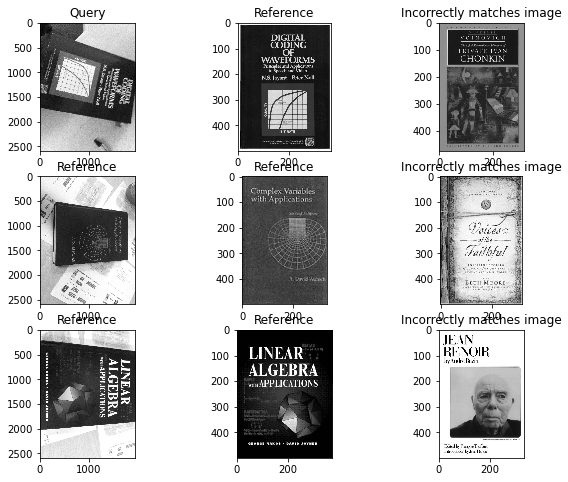

In [55]:
fig = plt.figure()

ax = fig.add_subplot(3, 3, 1)
imgplot = plt.imshow(query_images[keys[0]])
ax.set_title('Query')

ax = fig.add_subplot(3, 3, 2)
imgplot = plt.imshow(reference_images[keys[0]])
ax.set_title('Reference')

ax = fig.add_subplot(3, 3, 3)
imgplot = plt.imshow(reference_images[39])
ax.set_title('Incorrectly matches image')


ax = fig.add_subplot(3, 3, 4)
imgplot = plt.imshow(query_images[keys[1]])
ax.set_title('Reference')

ax = fig.add_subplot(3, 3, 5)
imgplot = plt.imshow(reference_images[keys[1]])
ax.set_title('Reference')

ax = fig.add_subplot(3, 3, 6)
imgplot = plt.imshow(reference_images[97])
ax.set_title('Incorrectly matches image')


ax = fig.add_subplot(3, 3, 7)
imgplot = plt.imshow(query_images[keys[2]])
ax.set_title('Reference')

ax = fig.add_subplot(3, 3, 8)
imgplot = plt.imshow(reference_images[keys[2]])
ax.set_title('Reference')

ax = fig.add_subplot(3, 3, 9)
imgplot = plt.imshow(reference_images[11])
ax.set_title('Incorrectly matches image')


***Your explanation of what you have done, and your results, here***

For the overall accuracy I got 96.03% with 3 incorrectly matched cases.

I used the top-k matches but still got nothing with 3, 5, 10 as k.

I have individually listed the query, the reference images above and the incorrectly matches image.

To change and improve the code for part 4, which was originally just a for loop with all the steps, I made two functions the 'get_good_matches' and the 'get_inline_matches'. These functions are used to get the good matches and the inline matches respectively.

After predicting all the query images and getting an overall accuracy of 97%, there were 3 cases that were incorrect.

So I used the top - 5 predictions for each of them and from the above output we can see that the cases did not give correct answer even after that.

5. Choose some extra query images of objects that do not occur in the reference dataset. Repeat step 4 with these images added to your query set. Accuracy is now measured by the percentage of query images correctly identified in the dataset, or correctly identified as not occurring in the dataset. Report how accuracy is altered by including these queries, and any changes you have made to improve performance.

In [56]:
# Reading the folder with extra query images
extra_query_books = sorted(glob.glob(os.path.join( '/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/extra_images/Query/*.jpg')))
extra_reference_books = sorted(glob.glob(os.path.join( '/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/extra_images/Reference/*.jpg')))

extra_query_images = []
extra_reference_images = []

for image in extra_query_books:
    i = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    extra_query_images.append(i)

for image in extra_reference_books:
    i = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    extra_reference_images.append(i)

In [57]:
print(len(extra_query_images))
print(len(extra_reference_images))

101
101


In [72]:
# Doing step 2 and 3 for all the query images and reporting the accuracy i.e.
# the number of correct matches in the dataset
thershold = 15 # the number of inline matches required to be considered a match
correct_predictions = 0 # counting the correct predictions
preds = [] # a list of predictions ; cache
scores = [] # a list of the list of scores for each query image
for i in range(len(extra_query_images)):
    
    key = i 
    q_image = extra_query_images[i]
    
    # creating ORB detetctor with nfeatures = 10000
    orb = cv2.ORB_create(10000) 
    kpq = orb.detect(q_image, None)
    kpq, desq = orb.compute(q_image, kpq)
    
    # Calling the get_inline_score function to obtain
    # the number of inliers i.e. matching score
    score = get_inline_scores(extra_reference_images, desq, kpq, orb)
    scores.append(score)
    
    # Calling the get_query_from_score function to get check the threshold value
    # and get the index of the predicted image
    pred = get_query_from_score(score, thershold)
    preds.append(pred) # chching the predictins for corrections
    
    # Checking if correct then incrementing the correct_predictions variable
    if pred == key:
        correct_predictions += 1
        
    elif pred == -1 and key < 102 and key > 90:
        correct_predictions += 1
        
    else:
        correct_predictions+=0

In [73]:
print((correct_predictions/len(query_images))*100)

94.05940594059405


In [76]:
print("number of correct predictions: " + str(correct_predictions))
for i in range(len(query_books)):
    if preds[i] != i:
        print(preds[i], i, max(scores[i]))

number of correct predictions: 95
96 54 20
-1 67 14
-1 70 12
-1 74 15
11 76 16
-1 92 14
-1 93 11
-1 94 14
-1 95 14
16 96 18
-1 97 9
-1 98 11
-1 99 11
-1 100 13


The dataset with extra images gave a 95 correct predictions out of 101 images. 
However, initially it was a lower accuracy and I had to increase the threshold value from 6 to 15 to match the extra images, so that it will consider them out of the dataset.
The ORB is set to 10000 samples and fast threshold is set to True

thus, after that the accuracy went up to about 95%

***Your explanation of results and any changes made here***

To change the code for Q4 was originally just a for loop with all the steps, but to improve it, I made two functions the 'get_good_matches' and the 'get_inline_matches'. 
These functions are used to get the good matches and the inline matches respectively.


6. Repeat step 4 and 5 for at least one other set of reference images from museum_paintings or landmarks, and compare the accuracy obtained. Analyse both your overall result and individual image matches to diagnose where problems are occurring, and what you could do to improve performance. Test at least one of your proposed improvements and report its effect on accuracy.


In [20]:
museum_query = sorted(glob.glob(os.path.join( '/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Query/*.jpg')))
museum_reference = sorted(glob.glob(os.path.join( '/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Reference/*.jpg')))

m_query_images = []
m_reference_images = []

for image in museum_query:
    i = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    m_query_images.append(i)

for image in museum_reference:
    i = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
    m_reference_images.append(i)

In [24]:
print(len(m_query_images))
print(len(m_reference_images))

91
91


In [261]:
# Doing step 4 for all the query images and reporting the accuracy i.e.
# the number of correct matches in the dataset
start = time.time()
thershold = 6 # the number of inline matches required to be considered a match
correct_predictions = 0 # counting the correct predictions
preds = [] # a list of predictions ; cache
scores = [] # a list of scores for each query image with reference image ; cache

for i in range(len(m_query_images)):
    
    key = i 
    q_image = m_query_images[i]
    
    # creating ORB detetctor with nfeatures = 10000
    orb = cv2.ORB_create(10000) 
    orb.setFastThreshold(10)
    
    # Getting the key points and descriptors
    kpq = orb.detect(q_image, None)
    kpq, desq = orb.compute(q_image, kpq)
    
    # Calling the get_inline_score function to obtain
    # the number of inliers i.e. matching score
    score = get_inline_scores(m_reference_images, desq, kpq, orb)
    scores.append(score)
    # Calling the get_query_from_score function to get check the threshold value
    # and get the index of the predicted image
    pred = get_query_from_score(score, thershold)
    preds.append(pred) # chching the predictins for corrections
    
    # Checking if correct then incrementing the correct_predictions variable
    if pred == key:
        correct_predictions += 1
    # if image doesnot exist, and the prediction is -1
    elif pred == -1 and key == 55:
        correct_predictions += 1
    # else no change 
    else:
        correct_predictions+=0
end = time.time()
time_taken = end - start

In [262]:
print("the code took", end-start, "seconds")
print("accuracy:", (correct_predictions/len(m_query_images))*100,"%")

the code took 1178.9475951194763 seconds
accuracy: 79.12087912087912 %


In [263]:
# The incorrect cases
print("Query : Pred : max Score")
for i in range(len(m_query_images)):
    if preds[i] != i:
        print(str(i) + "  \t" + str(preds[i]) + "\t"+str(max(scores[i])))

Query : Pred : max Score
12  	-1	6
21  	12	12
24  	12	11
29  	19	10
40  	50	11
41  	2	12
42  	49	11
44  	12	12
48  	20	9
49  	20	13
50  	12	16
53  	47	9
55  	12	13
58  	12	14
59  	57	16
68  	1	10
73  	20	12
79  	21	12
85  	12	9


The initial run with the same **threshold** as the book covers = 15 gave a poor accuracy of around 51%.

Checking the average scores for the images, the threshold is set to a lower level, the ORB parameter was also changed.


I used the whole of the museum paintings dataset for the part above, the accuracy is lower than the one I got on the book covers, this was resolved my using a lower **Threshold** = 6 rather than 15 (on the book_covers) and by tweaking the ORB parameter **fast threshold** = 10
using the above mentioned changes the accuracy went up to around 80% from the previous 58%.

However, the time it takes to compute is much more than the previous one:

1180 seconds compared to the 557 seconds on the previous run

# Question 3 (10%)

In Question 1, We hope that `ratio_test` can provide reasonable results for RANSAC. However, if it fails, the RANSAC may not get good results. In this case, we would like to try an improved matching method to replace the `ratio_test`. Here, the `gms_matcher` is recommened. You need to implement it and save results of 3 image pairs (you can select any image pairs from the dataset),
where you new method is better than 'ratio_test'.


1. Hint 1: `cv2.xfeatures2d.matchGMS()` can be used, but you need to install the opencv-contrib by `pip install opencv-contrib-python`
2. Hint 2: You do not need use KNN matching, because GMS does not require second nearest neighbor.
3. Hint 3: You need to change the parameters in `cv2.ORB_create()` for best results. See the setting in Github.
4. Hint 4: If your are interested in more details. Read the paper "GMS: Grid-based Motion Statistics for Fast, Ultra-robust Feature Correspondence", and the Github "https://github.com/JiawangBian/GMS-Feature-Matcher".

In [80]:
# load image at gray scale
query_img = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Query/008.jpg', cv2.IMREAD_GRAYSCALE)
ref_img = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Reference/008.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(query_img, cv2.COLOR_GRAY2BGR)
# find the keypoints and descriptors with ORB
orb = cv2.ORB_create(10000)
orb.setFastThreshold(0)

kpq, desq = orb.detectAndCompute(query_img, None)
kpr, desr = orb.detectAndCompute(ref_img, None)

In [81]:
# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.match(desq,desr)

In [82]:
from cv2.xfeatures2d import matchGMS

# Apply matchGMS() 
matches_gms = matchGMS(query_img.shape, ref_img.shape, kpq, kpr, matches, withScale=True, withRotation=False, thresholdFactor=6.0)

The number of matches is : 3043


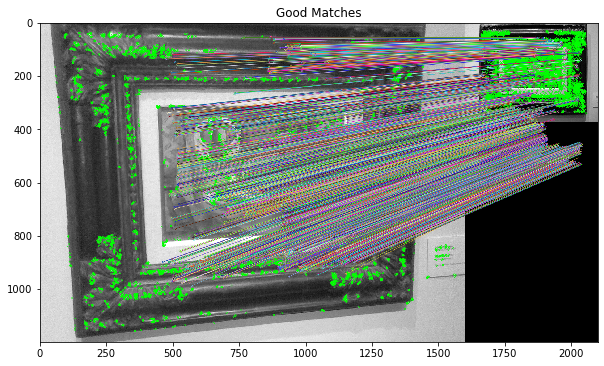

The number of inliers: 1706


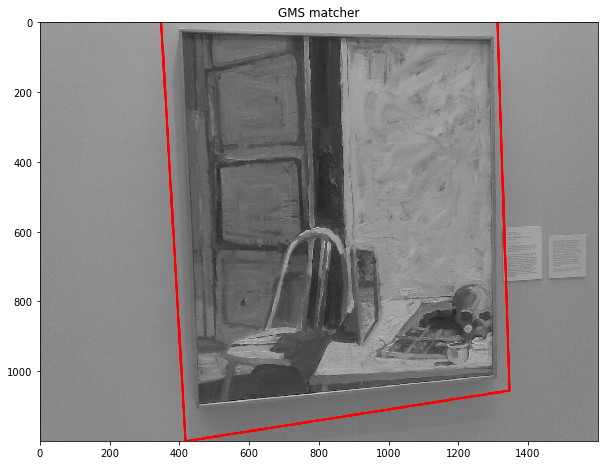

In [85]:
print("The number of matches is :", (len(matches_gms)))

# draw matches
img = cv2.drawMatches(img_q, kpq, img_r, kpr, matches_gms, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches")
plt.imshow(img)
plt.show()

q_pts = np.float32([kpq[m.queryIdx].pt for m in matches_gms]).reshape(-1,1,2)
r_pts = np.float32([kpr[m.trainIdx].pt for m in matches_gms]).reshape(-1,1,2)

if len(q_pts) > 3 and len(r_pts) > 3:
    matrix_ransac, mask_ransac = cv2.findHomography(r_pts, q_pts, cv2.RANSAC)
    
mask_ransac = mask_ransac.ravel().tolist()
print("The number of inliers:", sum(mask_ransac))


plt.title("GMS matcher")
im_rancas_gms = draw_outline(ref_img, query_color, matrix_ransac)

The number of ratio test matches is : 2293


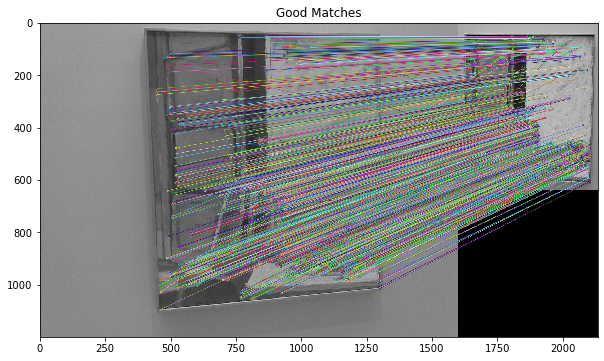

The number of inliers: 1366


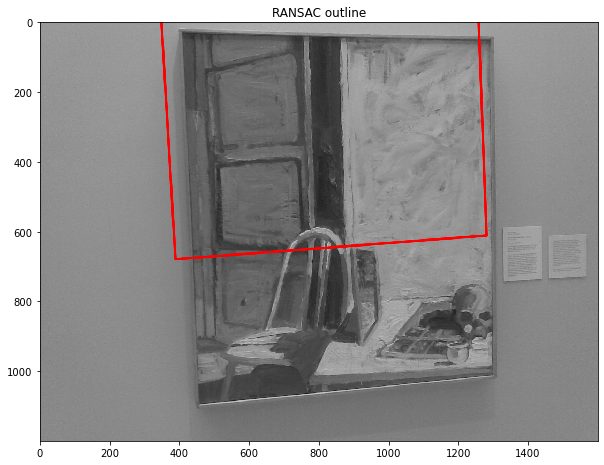

In [84]:
# the following image is used bacsuse the query image for this is inverted and the reference image is not inverted,
# so this would be a good test for the RANSAC method

orb = cv2.ORB_create(10000)
orb.setFastThreshold(0)
kpq2 = orb.detect(query_img,None)
kpq2, desq2 = orb.compute(query_img, kpq2)

kpr2 = orb.detect(ref_img,None)
kpr2, desr2 = orb.compute(ref_img, kpr2)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
ratio_matches = get_good_matches(matches, 0.8)

print("The number of ratio test matches is :", (len(ratio_matches)))


# draw matches
img = cv2.drawMatches(query_img, kpq2, ref_img, kpr2, ratio_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches")
plt.imshow(img)
plt.show()

# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in ratio_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in ratio_matches]).reshape(-1,1,2)
if len(q_pts) > 3 and len(r_pts) > 3:
    matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC)
    
    
mask_ransac2 = mask_ransac2.ravel().tolist()
print("The number of inliers:", sum(mask_ransac2))

plt.title('RANSAC outline')
im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)


The number of matches is : 379


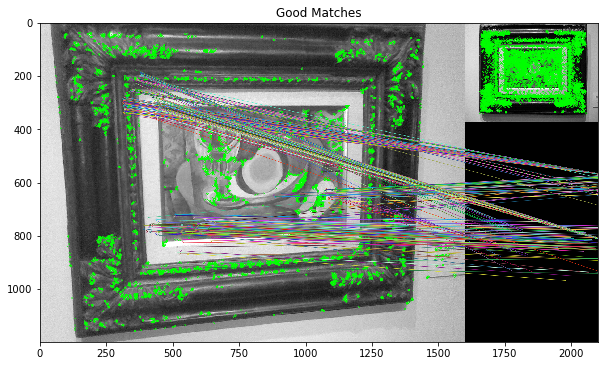

The number of inliers: 42


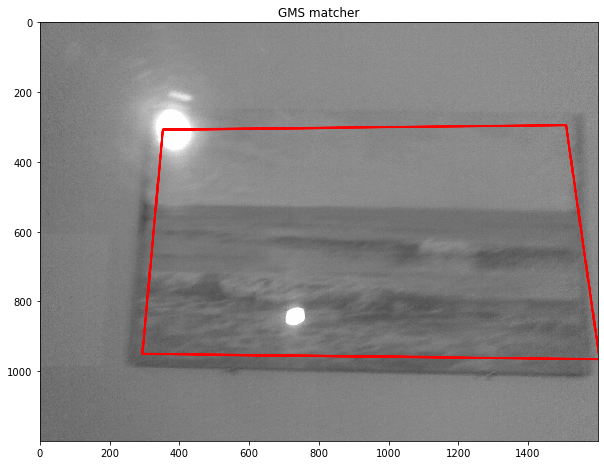

In [86]:
# load image at gray scale
query_img = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Query/054.jpg', cv2.IMREAD_GRAYSCALE)
ref_img = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Reference/054.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(query_img, cv2.COLOR_GRAY2BGR)
# find the keypoints and descriptors with ORB
orb = cv2.ORB_create(10000)
orb.setFastThreshold(0)

kpq, desq = orb.detectAndCompute(query_img, None)
kpr, desr = orb.detectAndCompute(ref_img, None)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.match(desq,desr)

matches_gms = matchGMS(query_img.shape, ref_img.shape, kpq, kpr, matches, withScale=True, withRotation=False, thresholdFactor=6.0)

print("The number of matches is :", (len(matches_gms)))

# draw matches
img = cv2.drawMatches(img_q, kpq, img_r, kpr, matches_gms, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches")
plt.imshow(img)
plt.show()

q_pts = np.float32([kpq[m.queryIdx].pt for m in matches_gms]).reshape(-1,1,2)
r_pts = np.float32([kpr[m.trainIdx].pt for m in matches_gms]).reshape(-1,1,2)

if len(q_pts) > 3 and len(r_pts) > 3:
    matrix_ransac, mask_ransac = cv2.findHomography(r_pts, q_pts, cv2.RANSAC)
    
mask_ransac = mask_ransac.ravel().tolist()
print("The number of inliers:", sum(mask_ransac))


plt.title("GMS matcher")
im_rancas_gms = draw_outline(ref_img, query_color, matrix_ransac)

The number of ratio test matches is : 207


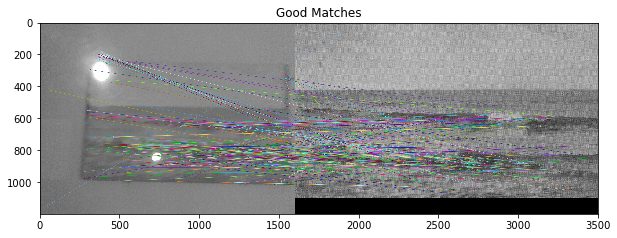

The number of inliers: 27


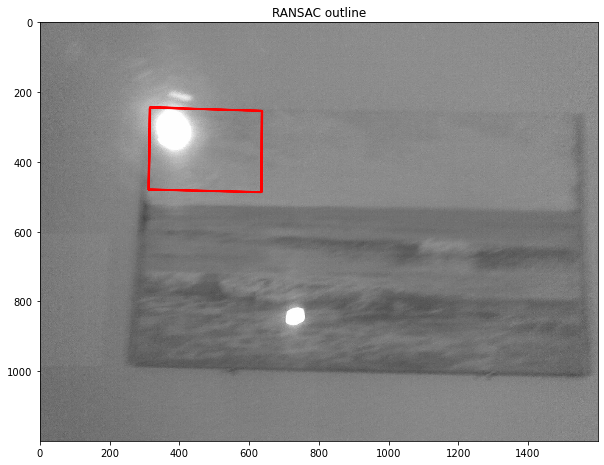

In [87]:
# the following image is used bacsuse the query image for this is inverted and the reference image is not inverted,
# so this would be a good test for the RANSAC method

orb = cv2.ORB_create(10000)
orb.setFastThreshold(0)
kpq2 = orb.detect(query_img,None)
kpq2, desq2 = orb.compute(query_img, kpq2)

kpr2 = orb.detect(ref_img,None)
kpr2, desr2 = orb.compute(ref_img, kpr2)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
ratio_matches = get_good_matches(matches, 0.8)

print("The number of ratio test matches is :", (len(ratio_matches)))


# draw matches
img = cv2.drawMatches(query_img, kpq2, ref_img, kpr2, ratio_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches")
plt.imshow(img)
plt.show()

# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in ratio_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in ratio_matches]).reshape(-1,1,2)
if len(q_pts) > 3 and len(r_pts) > 3:
    matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC)
    
    
mask_ransac2 = mask_ransac2.ravel().tolist()
print("The number of inliers:", sum(mask_ransac2))

plt.title('RANSAC outline')
im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)


The number of matches is : 1493


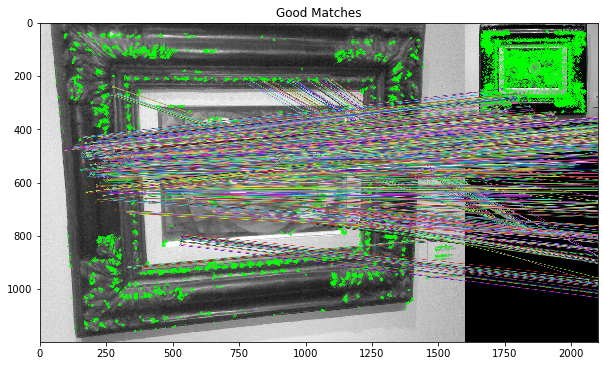

The number of inliers: 645


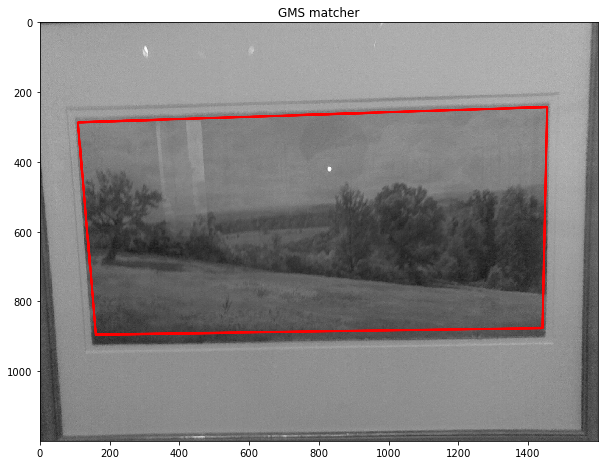

In [89]:
# load image at gray scale
query_img = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Query/027.jpg', cv2.IMREAD_GRAYSCALE)
ref_img = cv2.imread('/Users/angelwadhawan/Documents/University/2022/computer_vision/A2_smvs/museum_paintings/Reference/027.jpg', cv2.IMREAD_GRAYSCALE)
query_color = cv2.cvtColor(query_img, cv2.COLOR_GRAY2BGR)
# find the keypoints and descriptors with ORB
orb = cv2.ORB_create(10000)
orb.setFastThreshold(0)

kpq, desq = orb.detectAndCompute(query_img, None)
kpr, desr = orb.detectAndCompute(ref_img, None)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.match(desq,desr)

matches_gms = matchGMS(query_img.shape, ref_img.shape, kpq, kpr, matches, withScale=True, withRotation=False, thresholdFactor=6.0)

print("The number of matches is :", (len(matches_gms)))

# draw matches
img = cv2.drawMatches(img_q, kpq, img_r, kpr, matches_gms, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches")
plt.imshow(img)
plt.show()

q_pts = np.float32([kpq[m.queryIdx].pt for m in matches_gms]).reshape(-1,1,2)
r_pts = np.float32([kpr[m.trainIdx].pt for m in matches_gms]).reshape(-1,1,2)

if len(q_pts) > 3 and len(r_pts) > 3:
    matrix_ransac, mask_ransac = cv2.findHomography(r_pts, q_pts, cv2.RANSAC)
    
mask_ransac = mask_ransac.ravel().tolist()
print("The number of inliers:", sum(mask_ransac))


plt.title("GMS matcher")
im_rancas_gms = draw_outline(ref_img, query_color, matrix_ransac)

The number of ratio test matches is : 705


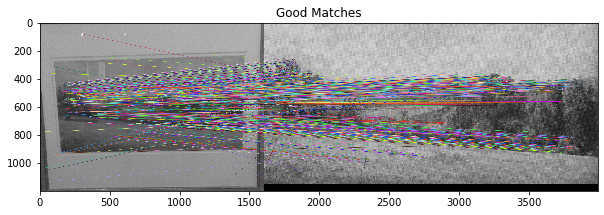

The number of inliers: 404


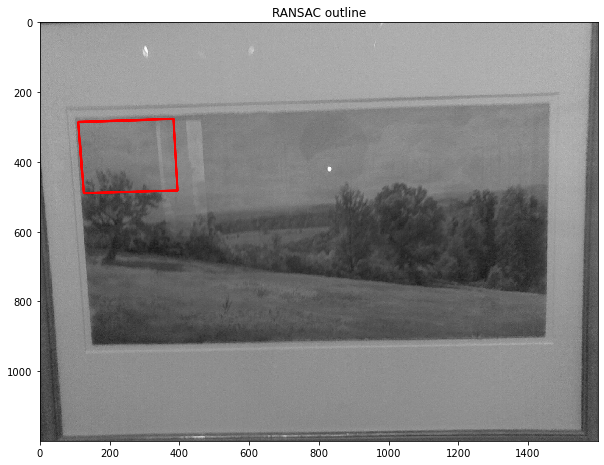

In [90]:
# the following image is used bacsuse the query image for this is inverted and the reference image is not inverted,
# so this would be a good test for the RANSAC method

orb = cv2.ORB_create(10000)
orb.setFastThreshold(0)
kpq2 = orb.detect(query_img,None)
kpq2, desq2 = orb.compute(query_img, kpq2)

kpr2 = orb.detect(ref_img,None)
kpr2, desr2 = orb.compute(ref_img, kpr2)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors.
matches = bf.knnMatch(desq2,desr2,k=2)

# Apply ratio test
ratio_matches = get_good_matches(matches, 0.8)

print("The number of ratio test matches is :", (len(ratio_matches)))


# draw matches
img = cv2.drawMatches(query_img, kpq2, ref_img, kpr2, ratio_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.title("Good Matches")
plt.imshow(img)
plt.show()

# code to display book location after RANSAC

q_pts2 = np.float32([kpq2[m.queryIdx].pt for m in ratio_matches]).reshape(-1,1,2)
r_pts2 = np.float32([kpr2[m.trainIdx].pt for m in ratio_matches]).reshape(-1,1,2)
if len(q_pts) > 3 and len(r_pts) > 3:
    matrix_ransac2, mask_ransac2 = cv2.findHomography(r_pts2, q_pts2, cv2.RANSAC)
    
    
mask_ransac2 = mask_ransac2.ravel().tolist()
print("The number of inliers:", sum(mask_ransac2))

plt.title('RANSAC outline')
im_rancas = draw_outline(r_im2, query_color, matrix_ransac2)


***Your results here***

As we can clearly see from the above three tests that the GMS matcher gave a much better and accurate result than the regular ratio test.

By using the GMS matcher, the number of **ovarall matches** and the **number of inliers** are much more that the ones we get with the ragular ratio test.


# Question 4: Reflection Questions (5%)

1. Describe the hardest situation you faced during the first two assignments. And how you overcome it? (3%)


2. How do you plan to finish the assignment to meet tight deadline? (2%)

1. 


Like every project there was a profusion of challenges that we encountered while completing the project, for starters, in Q2, of Assignment two, the biggest challenge that I encountered was to develop a model that gave an acceptable accuracy. At the start of this, the models that I developed had an accuracy was about 56 %, and while persistence was a key, reading the documentation, and conducting ORB, optimising the parameters and trying sample datasets. 
With the help of experimenting this algorithm on sample datasets, I could successfully devise and efficient model that produced an accuracy of about 80%. 

Additionally, I remember encountering problems in my first assignment, with regards to time management, and not submitting an assignment at the level which intended it to be, and this problem was rectified in the assignment this time, I tried to complete my assignment to at least a satisfactory level, a significant time before it was due.

2. 


Due to missing out on the deadline for the first assignment by about an hour I changed on how I worked on the second assignment:
- I started working on assignemnt 2 very early on.
- I realised that I underestimeted the ammount of work for the first assignment and I tried to improve on it by re-watching the lectures and starting as soon as ppossible.

- Along with that, instead of being stuck on one question for too long, I engaged more on the 'discussion board'. I found it extremly helpful in giving me hints in tricky situations.

All of these things helped me a lot in finishing the assignment on time